## THE BRIDGE (Data Science Bootcamp - Octubre 2020)
##  PROYECTO INDIVIDUAL
________________
### Predicción aplicada a los datos obtenidos y mostrados en el trabajo sobre el clima en Madrid (Agosto 2020).

Sobre los datos actualizados hasta el 13 de Octubre, aplicaremos distintos tipos de redes neuronales para predecir la temperatura y la presión en los días venideros.

Fuente de datos: Agencia Estatal de Meteorologia (AEMET)   https://opendata.aemet.es/centrodedescargas/inicio

Autor: 
- José Luis Manjon  presimanjon@yahoo.es;        git @JoseLuisManjon
_________________

## 1. Librerías requeridas para el análisis (* Import *)
_________

In [1]:
import sys 
sys.path.append('../src/utils') 
import pandas as pd 
import json 
import requests
import seaborn as sns
import numpy as np
from datetime import datetime
#import folders_tb as ftb
#import visualization_tb as vtb
#import mining_data_tb as mtb
# visualization libraries
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.graph_objs as go
import plotly.express as px 
import plotly.io as pio

import os
import IPython
import IPython.display
import matplotlib as mpl
import tensorflow as tf

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN, LSTM, Dropout, Bidirectional
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.models import Sequential, save_model, load_model

# print the graphs in the notebook
%matplotlib inline

# set seaborn style to white
sns.set_style("white")

Ahora voy a convertir los dos dataframe madrid_clima_index y madrid_clima_noindex en archivos json para poder usar sin necesidad de ejecutar todo el código anterior.

Considero que son los dataframes adecuados para poder empezar a trabajar con él, ya que los datos que suminstraba la AEMET han sido tratados, limpiados y depurados.

Descargo los json donde están los datos de la estación virtual de Madrid con los registros desde el año 1980 hasta el 13 de Octubre de 2020 que han sido creados en el notebook anterior.

In [2]:
#Para pasar el json a df
datos_clima = pd.read_json("clima_madrid_date_index.json")
datos_clima.head(3)

,tmed,prec,tmin,tmax,velmedia,presMed,racha,sol
1980-01-01,12.6,0.0,9.7,15.5,5.8,945.0,11.8,7.9
1980-01-02,8.2,0.0,4.1,12.3,1.6,948.3,9.9,4.5
1980-01-03,5.1,0.0,-0.8,11.0,0.6,950.7,2.5,7.3


In [3]:
madrid_clima_noindex= datos_clima.rename_axis('index').reset_index()
madrid_clima_noindex.rename(columns={'index': 'fecha'}, inplace=True)
madrid_clima_noindex.head(3)

,fecha,tmed,prec,tmin,tmax,velmedia,presMed,racha,sol
0,1980-01-01,12.6,0.0,9.7,15.5,5.8,945.0,11.8,7.9
1,1980-01-02,8.2,0.0,4.1,12.3,1.6,948.3,9.9,4.5
2,1980-01-03,5.1,0.0,-0.8,11.0,0.6,950.7,2.5,7.3


____________________
A partir de aqui esto no aplica al proyecto final de Bootcamp. Proviene del proyecto de agosto. Lo dejo por si puediera necesitarlo mas adelante.


Obtengo dataframe con las fechas agrupadas por meses y aplicando en el resample la media o la suma de los valores registrados durante ese mes o el valor máximo o mínimo, en función de la variable que represente cada columna.

In [28]:
madrid_mes_mean = madrid_clima1[['tmed','tmax','tmin','velmedia']].resample('M').mean()
madrid_mes_sum = madrid_clima1[['prec','sol']].resample('M').sum()
madrid_mes_max = madrid_clima1[['tmax','racha']].resample('M').max()
madrid_mes_min = madrid_clima1[['tmin']].resample('M').min()

En el dataframe madrid_mes_mean cambio el nombre de alguna de las columnas para que sea más comprensible su contenido.

In [29]:
madrid_mes_mean.rename(columns={'tmin':'tmin_media','tmax':'tmax_media'}, inplace=True)
madrid_mes_mean.head()

,tmed,tmax_media,tmin_media,velmedia
fecha,,,,
1980-01-31,5.558064,9.438710,1.678495,2.468817
1980-02-29,7.902299,12.668965,3.136782,1.547126
1980-03-31,9.648387,14.525806,4.765591,3.706452
1980-04-30,11.562222,17.673332,5.450000,3.174444
1980-05-31,14.008602,19.308601,8.704301,3.148387


Concateno horizontalmente los cuatro dataframes obtenidos de las distintas agrupaciones aplicadas, redondeo los valores a 1 decimal y añado los indices como columnas en el nuevo dataframe

In [30]:
#Concateno horizontalmente 
madrid_mensual = pd.concat([madrid_mes_mean, madrid_mes_sum, madrid_mes_max ,madrid_mes_min], axis=1)

In [31]:
# Redondeo a 1 decimal
colums_round = ('tmed', 'tmax_media','tmin_media', 'prec', 'tmax', 'racha', 'tmin','velmedia', 'sol')
for elem in colums_round:
    madrid_mensual[elem] = madrid_mensual[elem].apply(lambda x: round(x, 1))
madrid_mensual['Mes'] = madrid_mensual.index.month
madrid_mensual['Año'] = madrid_mensual.index.year

In [32]:
madrid_mensual_noindex = madrid_mensual.reset_index()

A continuación repetimos el proceso pero en este caso para tener agrupados los datos por años.

In [32]:
madrid_año_mean = madrid_clima1[['tmed','tmax','tmin', 'velmedia']].resample('Y').mean()
madrid_año_sum = madrid_clima1[['prec','sol']].resample('Y').sum()
madrid_año_max = madrid_clima1[['tmax','racha']].resample('Y').max()
madrid_año_min = madrid_clima1[['tmin']].resample('Y').min()


In [33]:
madrid_año_mean.rename(columns={'tmin':'tmin_media','tmax':'tmax_media'},inplace=True)

Concateno horizontalmente,redondeo a 1 decimal y añado la columna Año.

In [34]:
madrid_anual = pd.concat([madrid_año_mean, madrid_año_sum, madrid_año_max ,madrid_año_min], axis=1)
colums_round = ('tmed', 'tmax_media','tmin_media', 'prec', 'tmax', 'racha', 'tmin','velmedia', 'sol')
for elem in colums_round:
    madrid_anual[elem] = madrid_anual[elem].apply(lambda x: round(x, 1))
madrid_anual['Año'] = madrid_anual.index.year #Añado columna con los años
madrid_anual.head()

,tmed,tmax_media,tmin_media,velmedia,prec,sol,tmax,racha,tmin,Año
fecha,,,,,,,,,,
1980-12-31,14.1,19.9,8.3,2.7,367.9,2780.1,38.0,25.2,-5.7,1980
1981-12-31,14.7,20.7,8.7,2.6,431.6,2800.0,38.9,25.4,-4.6,1981
1982-12-31,14.6,20.2,9.0,2.4,380.9,2519.2,38.5,18.3,-1.5,1982
1983-12-31,14.7,20.7,8.6,3.0,261.7,2606.5,36.4,21.6,-8.0,1983
1984-12-31,13.4,19.1,7.7,3.3,453.4,2514.4,38.6,23.0,-3.7,1984


In [36]:
madrid_anual_noindex = madrid_anual.reset_index()

Fin de la zona excluida para este proyecto.
__________________________________________

## 4. Análisis de tendencias en los datos (EDA)
________________

In [91]:
madrid_clima.head()

,tmed,prec,tmin,tmax,velmedia,presMed,racha,sol
fecha,,,,,,,,
1980-01-01,12.633333,0.0,9.700000,15.533334,5.833333,945.000000,11.833334,7.933333
1980-01-02,8.200000,0.0,4.133333,12.266666,1.633333,948.333313,9.900000,4.500000
1980-01-03,5.066667,0.0,-0.800000,10.966667,0.566667,950.666687,2.500000,7.266666
1980-01-04,4.966667,0.0,-0.666667,10.600000,0.100000,948.000000,1.933333,7.200000
1980-01-05,5.266666,0.0,-0.466667,11.000000,0.633333,947.666687,4.366667,5.700000


In [4]:
c_temp_presion = ['tmax','tmin','presMed']

Tendencias de temperatura y presión atmosférica.
Realizo un gráfico de los diferentes valores de temperaturas diarias y de la presión para poder ver si existe algún tipo de estacionalidad.

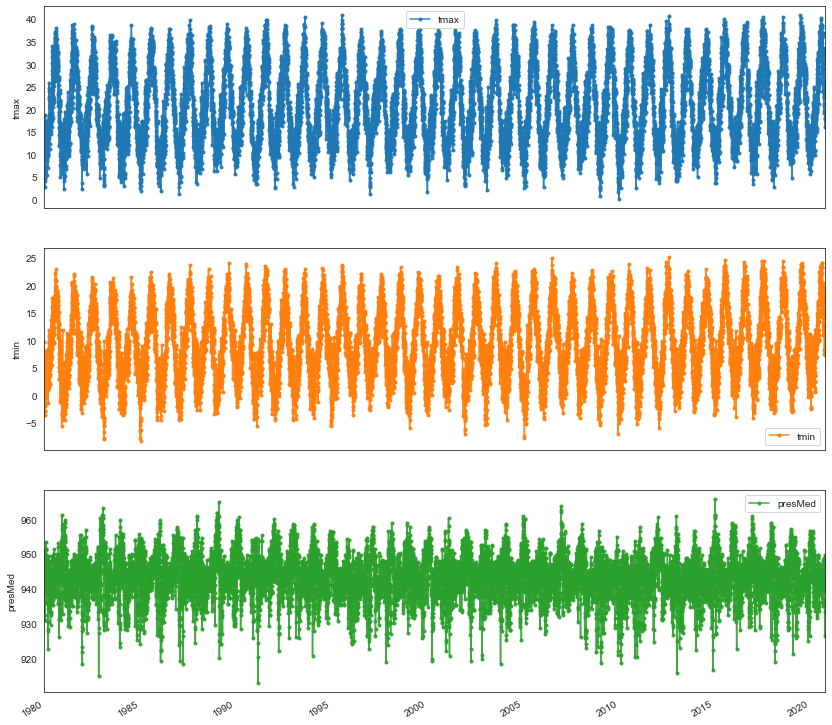

In [5]:
ejes = datos_clima[c_temp_presion].plot(marker='.', alpha=0.9, linestyle='-', figsize=(14,14), subplots=True)
for i, eje in enumerate(ejes):
    eje.set_ylabel(c_temp_presion[i])

Como se puede observar en los gráficos existe un patrón que se va repitiendo a lo largo del tiempo. Es decir, estacionalidad.

En los siguientes dos gráficos busco la posibilidad de estacionalidad anual en los valores de las precicipitaciones, velocidad media y en las rachas de viento. 

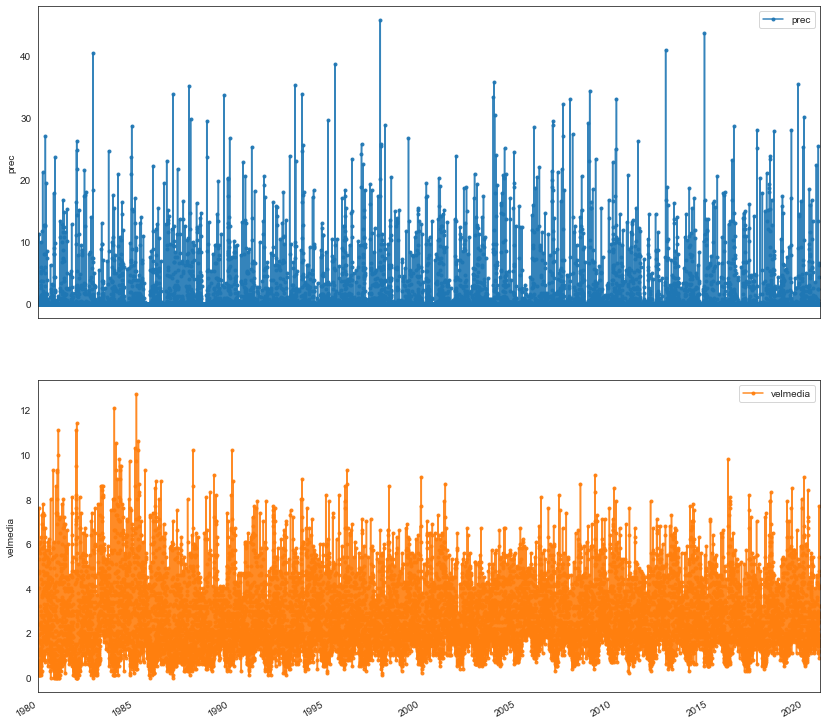

In [6]:
cols_pr = ['prec', 'velmedia']
ejes = datos_clima[cols_pr].plot(marker='.', alpha=0.9, linestyle='-',figsize=(14,14),subplots=True)
for i, eje in enumerate(ejes):
  eje.set_ylabel(cols_pr[i])

No se aprecia estacionalidad en las variables de precipitaciones y velocidad del viento 

Los valores que voy a estudiar son los datos diarios de la temperatura máxima (tmax), la mínima (tmin) y la presión atmosférica media (presMed)

In [ ]:
Creo tres dataframe independientes con cada una de las tres variables a analizar, utilizando como base el dataframe madrid_clima_noindex, donde la fecha está como indice.

In [32]:
madrid_tmax = datos_clima[[ 'tmax']]
madrid_tmax

,tmax
1980-01-01,15.5
1980-01-02,12.3
1980-01-03,11.0
1980-01-04,10.6
1980-01-05,11.0
...,...
2020-10-09,25.9
2020-10-10,24.3
2020-10-11,19.3
2020-10-12,19.4


In [8]:
madrid_tmin = datos_clima[['tmin']]

In [9]:
madrid_presMed = datos_clima[['presMed']]
madrid_presMed.tail()

,presMed
2020-10-09,947.7
2020-10-10,947.7
2020-10-11,949.7
2020-10-12,948.7
2020-10-13,942.0


In [10]:
train_split= 0.9
split_idx = int(len(madrid_tmax) * 0.9)
training_set = madrid_tmax[:split_idx].values
test_set = madrid_tmax[split_idx:].values

In [56]:
print(len(training_set), len(test_set))

13407 1490


Predeciremos 5 días en el futuro , utilizando 120 días de datos en el pasado . Para hacer esto, crearemos una colección de datos de entrenamiento mediante la cual los valores `x` serán datos en ventanas de 120 días y el valor `y` correspondiente como los datos de lluvia subsiguientes en los próximos 5 días.

In [11]:
# Predicción de 5 días con datos de 120 días
x_train = []
y_train = []
n_future = 5 # Predicción de los 5 días siguientes
n_past = 120 # Past 120 days
for i in range(0, len(training_set) - n_past - n_future + 1):
 x_train.append(training_set[i : i + n_past, 0])
 y_train.append(training_set[i + n_past : i + n_past + n_future, 0])

In [55]:
# Sera el primer elemento de x_train, el X_train[0]
print(training_set[0:120,0])
x_train[0]

[15.5 12.3 11.  10.6 11.   5.   5.8  7.4  7.4  9.   9.3  6.5  2.7  5.1
  9.2  4.9  6.8  4.9  4.1  7.   9.9  9.9  9.8 11.5 13.4 16.4 18.7 11.2
 13.4 10.9 12.1 11.9 12.8 13.7 16.6 17.5 12.1  9.9 12.1 16.6 11.9 12.9
 14.5 14.6 14.   9.9 16.7 17.5 15.9  9.7  8.5 11.9 10.3 12.6 12.7 12.3
  8.9  5.5 10.7 13.1 14.1 16.7 13.7 15.1 14.9 16.1 13.6 13.5 15.6 16.1
 16.4 17.7 11.3  9.7 10.3 17.3 12.9 14.3  9.9 10.1  7.1 10.9 11.5 14.1
 13.2 15.9 14.4 18.7 18.3 22.2 24.8 25.9 24.  22.8 16.8 16.6 16.6 17.
 17.6 15.5 18.3 16.7 16.7 13.7 11.3 12.4 15.  15.1 16.1 18.4 21.8 15.3
 18.1 18.9 18.  20.9 22.1 20.6 17.4 15.1]


array([[15.5],
       [12.3],
       [11. ],
       [10.6],
       [11. ],
       [ 5. ],
       [ 5.8],
       [ 7.4],
       [ 7.4],
       [ 9. ],
       [ 9.3],
       [ 6.5],
       [ 2.7],
       [ 5.1],
       [ 9.2],
       [ 4.9],
       [ 6.8],
       [ 4.9],
       [ 4.1],
       [ 7. ],
       [ 9.9],
       [ 9.9],
       [ 9.8],
       [11.5],
       [13.4],
       [16.4],
       [18.7],
       [11.2],
       [13.4],
       [10.9],
       [12.1],
       [11.9],
       [12.8],
       [13.7],
       [16.6],
       [17.5],
       [12.1],
       [ 9.9],
       [12.1],
       [16.6],
       [11.9],
       [12.9],
       [14.5],
       [14.6],
       [14. ],
       [ 9.9],
       [16.7],
       [17.5],
       [15.9],
       [ 9.7],
       [ 8.5],
       [11.9],
       [10.3],
       [12.6],
       [12.7],
       [12.3],
       [ 8.9],
       [ 5.5],
       [10.7],
       [13.1],
       [14.1],
       [16.7],
       [13.7],
       [15.1],
       [14.9],
       [16.1],
       [13

In [51]:
print(training_set[120:125,0])
y_train[0]

[15.3 15.4 17.1 16.4 17.7]


array([15.3, 15.4, 17.1, 16.4, 17.7])

In [12]:
x_train , y_train = np.array(x_train), np.array(y_train)
x_train = np.reshape(x_train, (x_train.shape[0] , x_train.shape[1], 1))

In [13]:
print(x_train.shape)
print(y_train.shape)

(13283, 120, 1)
(13283, 5)


Bidirectional: to ensure that information from earlier part of the sequence is available for the latter, and vice versa.

LSTM (x3) layers: the 120 units represent the 120-day windowed historical datasets while the return_sequences parameter specifies that each unit’s output will be used as the input of the next layer.

Dropout (p=0.2): for regularizing effects and preventing the network from training set’s over-fitting.

1 Dense layer: with 64 prediction neurons

2 Dense layer: with 5 prediction neurons where each represent a day into the: future.

In [97]:
def build_LSTM(num_units, num_dense, n_future):
    
    """
    Builds and compiles a RNN with LSTM layers
    Arguments:
              num_units: Number of units of a the LSTM layer
              embedding: Embedding length
              num_dense: Number of neurons in the dense layer
              n_future: with 5 prediction neurons where each represent a day into the future.
              
    Returns:
              A compiled Keras model.
    """
    model = Sequential()
    model.add(Bidirectional(LSTM(units=num_units, return_sequences=True, input_shape = (x_train.shape[1], 1))))
    model.add(Dropout(0.2))
    model.add(LSTM(units= 50, return_sequences=True))
    model.add(Dropout(0.2))
    model.add(LSTM(units= num_units, return_sequences=True))
    model.add(Dropout(0.2))
    model.add(LSTM(units= num_units))
    model.add(Dropout(0.2))
    model.add(Dense(num_dense, activation="relu"))
    model.add(Dense(units = n_future, activation='relu'))

    model.compile( optimizer='adam', 
        loss='mean_squared_error', 
        metrics=['mse'])

    return model

In [98]:
model_tmax = build_LSTM(num_units=30,num_dense=64,n_future=5,)

In [ ]:
#model_tmax.summary()

In [99]:
# Con este callbacks y con el checkpoint estoy guardando automaticamente el modelo cada vez que mejora (en este caso el accuracy)
from tensorflow.keras.callbacks import ModelCheckpoint
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)
checkpoint = ModelCheckpoint("modelo_tmax.h5", monitor='loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto')

In [103]:
EPOCHS = 60
BATCH_SIZE = 32

In [106]:
history_LSTM_5days = model_tmax.fit(x_train, y_train, epochs=EPOCHS, batch_size=BATCH_SIZE, callbacks=[callback, checkpoint])

Epoch 1/60
416/416 [==============================] - ETA: 0s - loss: 11.5414 - mse: 11.5414
Epoch 00001: loss did not improve from 11.53292
416/416 [==============================] - 101s 243ms/step - loss: 11.5414 - mse: 11.5414
Epoch 2/60
416/416 [==============================] - ETA: 0s - loss: 11.4884 - mse: 11.4884
Epoch 00002: loss improved from 11.53292 to 11.48836, saving model to modelo_tmax.h5
416/416 [==============================] - 98s 236ms/step - loss: 11.4884 - mse: 11.4884
Epoch 3/60
416/416 [==============================] - ETA: 0s - loss: 11.4143 - mse: 11.4143
Epoch 00003: loss improved from 11.48836 to 11.41435, saving model to modelo_tmax.h5
416/416 [==============================] - 97s 233ms/step - loss: 11.4143 - mse: 11.4143
Epoch 4/60
416/416 [==============================] - ETA: 0s - loss: 11.4497 - mse: 11.4497
Epoch 00004: loss did not improve from 11.41435
416/416 [==============================] - 107s 258ms/step - loss: 11.4497 - mse: 11.4497
Epoc

### Pronóstico del tiempo: inferencia

In [108]:
x_test = test_set[: n_past, 0]
y_test = test_set[n_past : n_past + n_future, 0]
x_test, y_test = np.array(x_test), np.array(y_test) # Lo convierto en una matriz
x_test = np.reshape(x_test, (1, x_test.shape[0], 1))
predicted_temperature = model_tmax.predict(x_test)
print('Predicted temperature {}'.format(predicted_temperature))
print('Real temperature {}'.format(y_test))

Predicted temperature [[12.074055 11.691208 11.426354 11.285074 11.227241]]
Real temperature [10.4  9.  11.2 12.5 11.2]


In [67]:
# test_set son nuestros últimos 1490 filas del df (conjunto de datos)
print(test_set[0:120,0]) # Son las primeras 120 filas (En nuestro caso valores de tmax) del conjunto de test
print(np.array(x_test)) # Convertido en una matriz.
print(np.array(x_test).shape) # Tras hacerle el reshape.
print()
print(x_test.shape)
test_set[120:125,0]

[20.4 25.4 24.2 24.7 25.8 27.6 28.3 28.1 27.7 27.6 27.3 27.  28.8 25.9
 25.7 26.3 27.1 26.4 28.3 28.3 27.7 28.7 27.6 26.9 25.9 25.2 24.1 14.3
 16.  18.6 18.8 20.7 18.7 20.1 19.6 19.1 19.4 17.  14.7 15.4 20.2 24.3
 24.5 23.  23.1 24.8 23.1 18.5 21.2 21.  15.7 15.  13.1 10.9 12.2 15.1
 13.3 14.8 13.6 18.3 15.8 16.1 15.8 17.5 13.3 12.6 11.2 12.8  9.4  8.7
  8.7  6.  10.  10.9 13.3 12.3 14.6 11.2 13.7 12.2 11.4 14.  14.4 13.9
 13.2 13.9 15.  14.2 10.9 10.5  9.5 10.1  8.9 13.  11.4 11.  10.2 13.1
 12.5 13.7 13.9 12.5 14.8 15.9 15.1 13.  12.1  3.5  4.3  6.7 11.5 12.3
 10.9 11.1 11.2 13.3 12.6 12.3 16.7 13.4]
[[[20.4]
  [25.4]
  [24.2]
  [24.7]
  [25.8]
  [27.6]
  [28.3]
  [28.1]
  [27.7]
  [27.6]
  [27.3]
  [27. ]
  [28.8]
  [25.9]
  [25.7]
  [26.3]
  [27.1]
  [26.4]
  [28.3]
  [28.3]
  [27.7]
  [28.7]
  [27.6]
  [26.9]
  [25.9]
  [25.2]
  [24.1]
  [14.3]
  [16. ]
  [18.6]
  [18.8]
  [20.7]
  [18.7]
  [20.1]
  [19.6]
  [19.1]
  [19.4]
  [17. ]
  [14.7]
  [15.4]
  [20.2]
  [24.3]
  [24.5]
  [

array([10.4,  9. , 11.2, 12.5, 11.2])

In [109]:
# Si lo que quiero es la predicción futura, de los primeros 5 días que no conozco todavía, en ese caso deberé tomar los últimos 120 filas del conjunto de test
x_test = test_set[len(test_set)-n_past: , 0]
# y_test = test_set[n_past : n_past + n_future, 0] # En este caso es desconocido, son datos del futuro
x_test = np.array(x_test) # Lo convierto en una matriz
x_test = np.reshape(x_test, (1, x_test.shape[0], 1))
predicted_temperature = model_tmax.predict(x_test)
print('Predicted temperature {}'.format(predicted_temperature))

Predicted temperature [[21.306309 20.395939 19.771965 19.285576 18.98422 ]]


### Guardo el modelo de red neuronal de la tmax

In [24]:
# Save the model
from tensorflow.keras.models import Sequential, save_model
path = 'C:/Users/jl/Documents/Jose_Luis/Cursos/The_bridge/Personal_works/others/final_proyect/resources/models/model__tmax_LSTM_5.h5'
save_model(model_tmax, path, save_format='h5')

In [121]:
path2 = 'C:/Users/jl/Documents/Jose_Luis/Cursos/The_bridge/Personal_works/others/final_proyect/resources/models'

Las dos siguientes celdas de código son para guardar y cargar el modelo, siguiendo la versión V2 que tenemos en los apuntes de W13D1.

In [122]:
import json
import time
# save
moment=time.localtime()
name='Mtmax_LSTM_5days_{}_{}-{}-{}'.format(history_LSTM_5days.history["mse"][-1],moment[2],moment[3],moment[4])
model_tmax.save(path2 + name)
model_json = model_tmax.to_json()
with open(path2 + name+'.json', "w") as json_file:
    json.dump(model_json, json_file)
model_tmax.save_weights(path2 + name +'.h5')

INFO:tensorflow:Assets written to: C:/Users/jl/Documents/Jose_Luis/Cursos/The_bridge/Personal_works/others/final_proyect/resources/modelsMtmax_LSTM_5days_11.224271774291992_22-20-17\assets


In [ ]:
# load
json_file = open('nombre_modelo.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
model.load_weights('nombre_modelo.h5')

## Modeling the minimun temperature data

Since we have covered modeling the humidity data step-by-step in detail, we will show the modeling with other two parameters - minimujn temperature and pressure - quickly with similar code but not with detailed text.

In [170]:
train_tmin = np.array(madrid_tmin['tmin'][:Tp])
test_tmin = np.array(madrid_tmin['tmin'][Tp:])

train_tmin=train_tmin.reshape(-1,1)
test_tmin=test_tmin.reshape(-1,1)

step = 30

# add step elements into train and test
test_tmin = np.append(test_tmin,np.repeat(test_tmin[-1,],step))
train_tmin = np.append(train_tmin,np.repeat(train_tmin[-1,],step))

trainX_tmin,trainY_tmin =convertToMatrix(train_tmin,step)
testX_tmin,testY_tmin =convertToMatrix(test_tmin,step)

trainX_tmin = np.reshape(trainX_tmin, (trainX_tmin.shape[0], 1, trainX_tmin.shape[1]))
testX_tmin = np.reshape(testX_tmin, (testX_tmin.shape[0], 1, testX_tmin.shape[1]))

In [172]:
model_tmin = build_simple_rnn(num_units=128,num_dense=32,embedding=8,lr=0.0005)

batch_size=30
num_epochs = 1000

model_tmin.fit(trainX_tmin,trainY_tmin, 
          epochs=num_epochs, 
          batch_size=batch_size, 
          callbacks=[MyCallback()],verbose=0)

Epoch number 50 done
Epoch number 100 done
Epoch number 150 done
Epoch number 200 done
Epoch number 250 done
Epoch number 300 done
Epoch number 350 done
Epoch number 400 done
Epoch number 450 done
Epoch number 500 done
Epoch number 550 done
Epoch number 600 done
Epoch number 650 done
Epoch number 700 done
Epoch number 750 done
Epoch number 800 done
Epoch number 850 done
Epoch number 900 done
Epoch number 950 done
Epoch number 1000 done
Epoch number 1050 done
Epoch number 1100 done
Epoch number 1150 done
Epoch number 1200 done
Epoch number 1250 done
Epoch number 1300 done
Epoch number 1350 done
Epoch number 1400 done
Epoch number 1450 done
Epoch number 1500 done
Epoch number 1550 done
Epoch number 1600 done
Epoch number 1650 done
Epoch number 1700 done
Epoch number 1750 done
Epoch number 1800 done
Epoch number 1850 done
Epoch number 1900 done
Epoch number 1950 done
Epoch number 2000 done


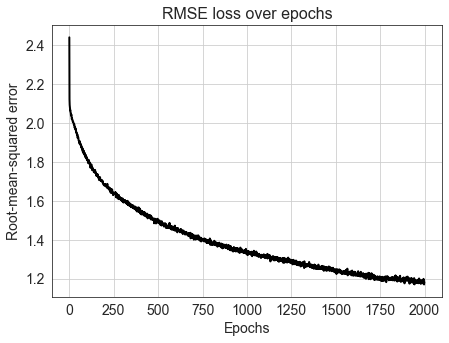

In [173]:
plt.figure(figsize=(7,5))
plt.title("RMSE loss over epochs",fontsize=16)
plt.plot(np.sqrt(model_tmin.history.history['loss']),c='k',lw=2)
plt.grid(True)
plt.xlabel("Epochs",fontsize=14)
plt.ylabel("Root-mean-squared error",fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [175]:
train_tminPredict = model_tmin.predict(trainX_tmin)
test_tminPredict= model_tmin.predict(testX_tmin)
predicted_tmin=np.concatenate((train_tminPredict,test_tminPredict),axis=0)

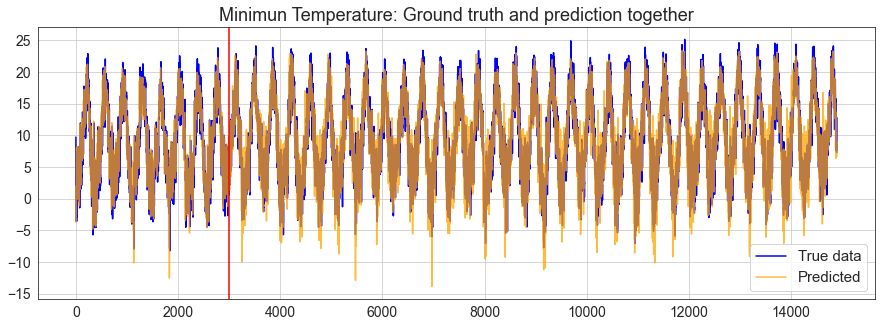

In [176]:
index = madrid_tmin.index.values

plt.figure(figsize=(15,5))
plt.title("Minimun Temperature: Ground truth and prediction together",fontsize=18)
plt.plot(index,madrid_tmin['tmin'],c='blue')
plt.plot(index,predicted_tmin,c='orange',alpha=0.75)
plt.legend(['True data','Predicted'],fontsize=15)
plt.axvline(x=Tp, c="r")
plt.grid(True)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

## Modeling the atmospheric pressure data

In [177]:
train_presMed = np.array(madrid_presMed['presMed'][:Tp])
test_presMed = np.array(madrid_presMed['presMed'][Tp:])

train_presMed=train_presMed.reshape(-1,1)
test_presMed=test_presMed.reshape(-1,1)

step = 8

# add step elements into train and test
test_presMed = np.append(test_presMed,np.repeat(test_presMed[-1,],step))
train_presMed = np.append(train_presMed,np.repeat(train_presMed[-1,],step))

trainX_presMed,trainY_presMed =convertToMatrix(train_presMed,step)
testX_presMed,testY_presMed =convertToMatrix(test_presMed,step)

trainX_presMed = np.reshape(trainX_presMed, (trainX_presMed.shape[0], 1, trainX_presMed.shape[1]))
testX_presMed = np.reshape(testX_presMed, (testX_presMed.shape[0], 1, testX_presMed.shape[1]))

In [179]:
model_preMed = build_simple_rnn(num_units=128,num_dense=32,embedding=8,lr=0.0005)

batch_size=8
num_epochs = 1000

model_preMed.fit(trainX_presMed,trainY_presMed, 
          epochs=num_epochs, 
          batch_size=batch_size, 
          callbacks=[MyCallback()],verbose=0)

Epoch number 50 done
Epoch number 100 done
Epoch number 150 done
Epoch number 200 done
Epoch number 250 done
Epoch number 300 done
Epoch number 350 done
Epoch number 400 done
Epoch number 450 done
Epoch number 500 done
Epoch number 550 done
Epoch number 600 done
Epoch number 650 done
Epoch number 700 done
Epoch number 750 done
Epoch number 800 done
Epoch number 850 done
Epoch number 900 done
Epoch number 950 done
Epoch number 1000 done


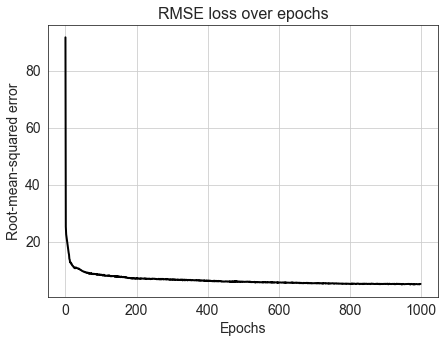

In [180]:
plt.figure(figsize=(7,5))
plt.title("RMSE loss over epochs",fontsize=16)
plt.plot(np.sqrt(model_preMed.history.history['loss']),c='k',lw=2)
plt.grid(True)
plt.xlabel("Epochs",fontsize=14)
plt.ylabel("Root-mean-squared error",fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [181]:
train_presMedPredict = model_preMed.predict(trainX_presMed)
test_presMedPredict= model_preMed.predict(testX_presMed)
predicted_presMed=np.concatenate((train_presMedPredict,test_presMedPredict),axis=0)

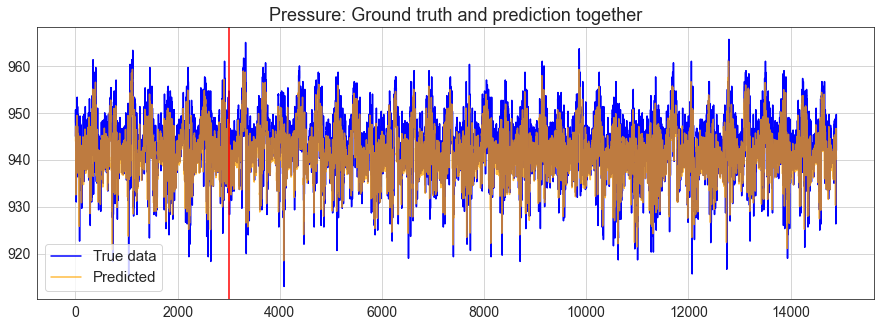

In [182]:
index = madrid_presMed.index.values

plt.figure(figsize=(15,5))
plt.title("Pressure: Ground truth and prediction together",fontsize=18)
plt.plot(index,madrid_presMed['presMed'],c='blue')
plt.plot(index,predicted_presMed,c='orange',alpha=0.75)
plt.legend(['True data','Predicted'],fontsize=15)
plt.axvline(x=Tp, c="r")
plt.grid(True)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()